In [22]:
import random as rd
import itertools
import numpy as np
import warnings
import scipy
import os
import plotly.graph_objects as go
import plotly.express as px 
import pandas as pd
import matplotlib.pyplot as plt
# !pip install catboost
#import xgboost as xgb
import sklearn.svm as svm
import plotly.figure_factory as ff
# !jupyter nbextension enable --py widgetsnbextension
from tqdm import tqdm
from catboost import CatBoostRegressor
from catboost import CatBoostClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn import ensemble , model_selection, metrics ,datasets,tree,linear_model
from sklearn.cross_decomposition import PLSRegression
from sklearn.metrics import mean_squared_error, r2_score,accuracy_score,roc_curve, auc,confusion_matrix,classification_report
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV,cross_val_score, cross_val_predict,train_test_split
from sklearn import preprocessing,datasets
from sklearn.preprocessing import StandardScaler, MaxAbsScaler,normalize,label_binarize
from sklearn.ensemble import RandomForestClassifier
# from pipelinehelper import PipelineHelper
from sklearn.svm import LinearSVC
from sklearn.feature_selection import SelectFromModel
from sklearn.neighbors import LocalOutlierFactor
from scipy.signal import savgol_filter
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from scipy.stats import t
from sklearn.svm import OneClassSVM,LinearSVC
from sklearn.ensemble import IsolationForest
from sklearn.datasets import make_regression
from sklearn.decomposition import PCA
from sklearn.linear_model import Lasso, Ridge, LogisticRegression, LinearRegression, RidgeCV
from itertools import combinations  
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import LinearSVC
from scipy.stats import chisquare,chi2_contingency
# from sklearn.manifold.t_sne import TSNE
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans 
from scipy.spatial import cKDTree






def rubberband_corr(z):
        x = np.arange(0, z.shape[1],1)
        n = len(x)
        Y = z
        [m , n] = np.shape(Y)
        for i in range(int(m)):
            y = Y[i , :]
            
            if sum(np.isnan(y)) > 0:
                continue
            o = []
            for i in range(int(n/48)):
                time = y[48*i:48*(i+1)]
                a = (np.where(time == time.min())[0])
                #print(time)
                #print(np.where(time == time.min()))
                o.append(((a) + 48*i)[0])
            Y = np.vstack((Y, y - np.interp(x, x[o], y[o])))
                
        return Y[m:, :]*(Y[m:, :] > 0)

def snv(input_data):
  
    # Define a new array and populate it with the corrected data  
    output_data = np.zeros_like(input_data)
    for i in range(input_data.shape[0]):
        # Apply correction
        output_data[i,:] = (input_data[i,:] - np.mean(input_data[i,:])) / np.std(input_data[i,:])
    return output_data

def minmax_f(input_data):
  
    # Define a new array and populate it with the corrected data  
    output_data = np.zeros_like(input_data)
    for i in range(input_data.shape[0]):
        # Apply correction
        output_data[i,:] = (input_data[i,:] - np.min(input_data[i,:])) / (np.max(input_data[i,:])-np.min(input_data[i,:]))
    return output_data
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()    



    
target_names =  ['apf_legoch_10-6M','apf_sem_10-6M','apf_serd_10-6M']   
target_weights =  ['apf_legoch_weights','apf_sem_weights','apf_serd_weights'] 

In [23]:
all_data = [0] * 9
dir0 = r'C:\Users\safiu\\apf_new'
for m,filename0 in enumerate(os.listdir(dir0)):
    listdir =dir0+'\\'+str(filename0)     #  немного странные циклы - надо путь в шести местах менять
    k = 0
    tags = []
    tags1 = []
    for filename in os.listdir(listdir):
        #print (filename)
        listdir1 =(listdir +'\\'+str(filename))
       # print (filename)
        for filename1 in os.listdir(listdir1):
            print (filename1)
            with open(os.path.join(listdir1, filename1), 'r') as f:
                term = pd.read_csv(f,names = ['x',filename1], sep='\t')
                x_axis = term[term.columns[0]]
                if (('apf_legoch_10') in filename1):
                    tags.append(0)

                if (('apf_sem_10') in filename1):
                    tags.append(1)
                if (('apf_serd') in filename1):
                    tags.append(2)

                if k ==0:
                    alldata = term
                    k = k+1
                    continue
            alldata=pd.concat([alldata, term[term.columns[1]]], axis=1, sort=False)

    all_data[m]=alldata[alldata.columns[1:]].T
    all_data[m]['classes'] = tags
    all_data[m]['conc'] = all_data[m].index
data = all_data[0]

apf_legoch_10-6M_p4 01.txt
apf_legoch_10-6M_p4 02.txt
apf_legoch_10-6M_p4 03.txt
apf_legoch_10-6M_p4 04.txt
apf_legoch_10-6M_p4 05.txt
apf_legoch_10-6M_p4 06.txt
apf_legoch_10-6M_p4 07.txt
apf_legoch_10-6M_p4 08.txt
apf_legoch_10-6M_p4 09.txt
apf_legoch_10-6M_p4 10.txt
apf_legoch_10-6M_p4 11.txt
apf_legoch_10-6M_p4 12.txt
apf_legoch_10-6M_p4 13.txt
apf_legoch_10-6M_p4 14.txt
apf_legoch_10-6M_p4 15.txt
apf_legoch_10-6M_p4 16.txt
apf_legoch_10-6M_p4 17.txt
apf_legoch_10-6M_p4 18.txt
apf_legoch_10-6M_p4 19.txt
apf_legoch_10-6M_p4 20.txt
apf_legoch_10-6M_p4 21.txt
apf_legoch_10-6M_p4 22.txt
apf_legoch_10-6M_p4 23.txt
apf_legoch_10-6M_p4 24.txt
apf_legoch_10-6M_p4 25.txt
apf_legoch_10-6M_p4 26.txt
apf_legoch_10-6M_p4 27.txt
apf_legoch_10-6M_p4 28.txt
apf_legoch_10-6M_p4 29.txt
apf_legoch_10-6M_p4 30.txt
apf_legoch_10-6M_p4 31.txt
apf_legoch_10-6M_p4 32.txt
apf_legoch_10-6M_p4 33.txt
apf_legoch_10-6M_p4 34.txt
apf_legoch_10-6M_p4 35.txt
apf_legoch_10-6M_p4 36.txt
apf_legoch_10-6M_p4 37.txt
a

In [24]:
color = ['red', 'green', 'blue','orange','brown','pink','magenta']
cut_mark = 170
    
all_data = []
med = 5
for  k in [data]:
    df = (np.array(k[k.columns[:-2]])[:,cut_mark:])
    
    
    df = savgol_filter(df,11,3)
    df = snv(df)
#     df = np.apply_along_axis(arpls, 1, df)
    df = rubberband_corr(df)

#     new_X_train  = np.zeros((df.shape[0],df.shape[1]//med))   
#     for j in range((df.shape[0])):
#             for i in range((df.shape[1] // med)):
#                 new_X_train[j,i] = ( np.median(df[j,med*i:med*i+med]))
#     df = (new_X_train)
#     df = (np.diff(df))
#     poly = PolynomialFeatures(2,interaction_only=True)
#     df  = poly.fit_transform(df)
 


    df =pd.DataFrame(df)
    df['classes'] = list(k.classes)
    df['conc'] = list(k.conc)
    all_data.append(df)


            


## Data

In [25]:
fig = go.Figure()  
for lab_num,label in enumerate(np.arange(3)):
    
    for num,df in enumerate([all_data[i] for i in range(1)]):
            for klass in range(len(df[df.classes==label])):
                one_c_df = df[df.classes==label]
                y = one_c_df.iloc[klass][:-3][cut_mark:]
                fig.add_trace(go.Scatter(x = x_axis[cut_mark:], y= y
                                            , marker=dict(color=color[lab_num]),
                                      mode='lines',
                              name='concentr:' +str(label)))  #+'_n:' +str(num+1)+ str(np.array(one_c_df.conc)[klass])[-7:]))
            fig.update_layout(
            title='Data')
fig.show()
            

## Classification

                  precision    recall  f1-score   support

apf_legoch_10-6M       1.00      1.00      1.00        33
   apf_sem_10-6M       1.00      1.00      1.00        36
  apf_serd_10-6M       1.00      1.00      1.00        30

        accuracy                           1.00        99
       macro avg       1.00      1.00      1.00        99
    weighted avg       1.00      1.00      1.00        99



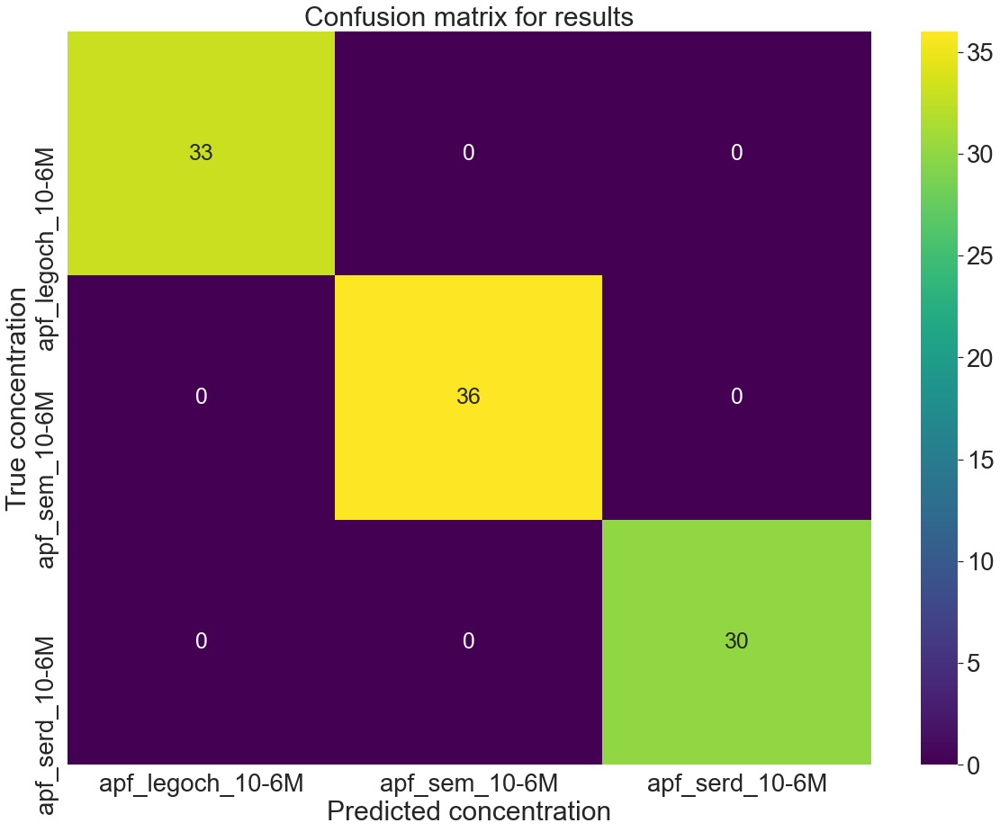

In [26]:

X_train, X_test, y_train, y_test = train_test_split(np.array(all_data[0])[:,:-2],
                                                    np.array(all_data[0])[:,-2:], test_size = 0.5)
   

noise = np.random.normal(0,0.3*np.mean(np.std(X_train)), X_train.shape)
new_signal = X_train + noise
X_train =pd.DataFrame(X_train)
new_signal =pd.DataFrame(new_signal)
X_train = pd.concat((X_train,new_signal))
y_train = np.concatenate((y_train,y_train))

lda = LDA(n_components = 2, store_covariance = True)

# scores = cross_val_score(LDA(n_components = 3), (X_train), list(y_train[:,0]), cv=3)
# print("Accuracy: %0.4f (+/- %0.4f)" % (scores.mean(), scores.std() * 2))
lda.fit((X_train), list(y_train[:,0]))
y_pred = lda.predict(X_test )


auf =pd.DataFrame()
auf['classes'] = list(y_test[:,0])
auf['lde'] = y_pred
print(classification_report(auf.classes, auf.lde ,target_names= target_names))

Xlda = lda.transform((X_test))
dataaa = pd.DataFrame(Xlda, columns = ['П1','П2'])
dataaa['classes'] = y_pred
dataaa['col'] = list(y_test)

fig = px.scatter(dataaa, x='П1', y='П2', color = [x[:-16] for x in y_test[:,1]], title='Test samples')
fig.update_layout(   font=dict(
        size=20
    )
)
fig.show()




Xlda = lda.transform((X_train) )
dataaa = pd.DataFrame(Xlda, columns = ['F1','F2'])
dataaa['classes'] = y_train[:,0]
dataaa['col'] = list(y_train[:,1])
fig = px.scatter(dataaa, x='F1', y='F2', color = [x[:-8] for x in y_train[:,1]], title='Train samples')
fig.update_layout(   font=dict(
        size=25
    )
)
fig.show()



z =confusion_matrix(list(y_test[:,0]), list(y_pred))

x = target_names
import seaborn as sn

array = z

df_cm = pd.DataFrame(array,x,x)
plt.figure(figsize=(20,15))
sn.set(font_scale=2.5) # for label size
ax = sn.heatmap(df_cm, annot=True,cmap = 'viridis', annot_kws={"size": 25}) # font size
                 
ax.set_ylabel("True concentration")
ax.set_xlabel("Predicted concentration") 
plt.title('Confusion matrix for results')
plt.show()



# plt.figure(figsize = ((40,30)))
# [plt.fill_between(x_axis[cut_mark:] ,-0.2,savgol_filter([j/np.max(lda.coef_[0,:]) for j in lda.coef_[i,:]],21,3), label = target_weights[i]) for i in range(3)
# ]# [plt.plot(x_axis[cut_mark:] ,savgol_filter([j/np.max(lda.coef_) if j>20 for j in lda.coef_[i,:]],15,3) for i in range(3))]
# [plt.plot(x_axis[cut_mark:] ,0.5+np.mean(np.array(all_data[0][all_data[0].classes==i])[:,:-2], axis = 0), label = target_names[i]) for i in range(3)
# ]
# plt.legend()


## Feature importance

In [27]:

weis = np.zeros((3,len(x_axis[cut_mark:])))
for i in range(100):
    X_train, X_test, y_train, y_test = train_test_split(np.array(all_data[0])[:,:-2],
                                                        np.array(all_data[0])[:,-2:], test_size = 0.4)
    noise = np.random.normal(0,0.3*np.mean(np.std(X_train)), X_train.shape)
    new_signal = X_train + noise
    X_train =pd.DataFrame(X_train)
    new_signal =pd.DataFrame(new_signal)
    X_train = pd.concat((X_train,new_signal))
    y_train = np.concatenate((y_train,y_train))
    lda = LDA(n_components = 2)#, store_covariance = True)
    lda.fit((X_train), list(y_train[:,0]))
    y_pred = lda.predict(X_test )
    auf =pd.DataFrame()
    auf['classes'] = list(y_test[:,0])
    auf['lde'] = y_pred
    Xlda = lda.transform((X_test))
    dataaa = pd.DataFrame(Xlda, columns = ['F1','F2'])
    dataaa['classes'] = y_pred
    dataaa['col'] = list(y_test)
    weis[0,:] += lda.coef_[0]
    weis[1,:] += lda.coef_[1]
    weis[2,:] += lda.coef_[2]

weis = weis/100

y2 = savgol_filter([(j/np.max(weis)) if ( (j>0) &  (j>np.quantile(np.sort(weis[1,:]), 0.95)) & (feat_num > 50) & (feat_num < 750)) else 0
 for feat_num,j in enumerate(weis[1,:])],11,3)
y1 = savgol_filter([(j/np.max(weis)) if ( (j>0) & (j>np.quantile(np.sort(weis[0,:]), 0.95)) & (feat_num > 50) & (feat_num < 750)) else 0
 for feat_num,j in enumerate(weis[0,:])],11,3)
y3 = savgol_filter([(j/np.max(weis)) if ( (j>0) & (j>np.quantile(np.sort(weis[2,:]), 0.95)) & (feat_num > 50) & (feat_num < 750)) else 0
 for feat_num,j in enumerate(weis[2,:])],11,3)

    
    
y1 = [i if i>0 else 0 for i in y1 ]
y2 = [i if i>0 else 0 for i in y2 ]
y3 = [i if i>0 else 0 for i in y3 ]    



In [28]:
fig = go.Figure()  
barnames = ['apf_legoch_weights','apf_sem_weights','apf_serd_weights']   
target_names =  ['apf_legoch','apf_sem','apf_serd']    

for i,y in enumerate([y1,y2,y3]):
    
    fig.add_trace(go.Bar(x = x_axis[cut_mark:], y= y
                                            
                                     
                            ,width=2.5 , name=barnames[i])) 
    fig.add_trace(go.Scatter(x = x_axis[cut_mark:], y= np.mean(np.array(all_data[0][all_data[0].classes==i])[:,:-2], axis = 0)
#                                             , marker=dict(color=target_names[lab_num])
                                     
                            ,mode = 'lines' , name= target_names[i]))


fig.update_layout(width=2000,
    height=1000,legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
),font=dict(
        size=25
    ))

fig.update_yaxes(title = 'I',title_font=dict(size = 40),tick0=0,dtick=1)
fig.update_xaxes(title = '$$ {Raman shift} \;\; (cm^{-1})  $$',title_font=dict(size = 40),dtick=100)

fig.show()

## Band selection

In [29]:
accs = []
sub_plots = []
cond2 = ((x_axis[cut_mark:]>800) & (x_axis[cut_mark:]<818)) | ((x_axis[cut_mark:]>1572) & (x_axis[cut_mark:]<1591))
cond3 = ((x_axis[cut_mark:]>1580) & (x_axis[cut_mark:]<1595)) | ((x_axis[cut_mark:]>1235) & (x_axis[cut_mark:]<1250))
cond1 = ((x_axis[cut_mark:]>1169) & (x_axis[cut_mark:]<1185)) | ((x_axis[cut_mark:]>1482) & (x_axis[cut_mark:]<1491))
features = np.concatenate((
((np.where(cond2))[0])[np.argsort(np.array(y2)[((np.where(cond2))[0])])][::-1],
((np.where(cond3))[0])[np.argsort(np.array(y3)[((np.where(cond3))[0])])][::-1],
((np.where(cond1))[0])[np.argsort(np.array(y1)[((np.where(cond1))[0])])][::-1]))
X_train1, X_test1, y_train1, y_test = train_test_split(np.array(all_data[0])[:,:-2],
                                                        np.array(all_data[0])[:,-2:], test_size = 0.4)
for feature in range(3,len(features)):
    X_train= X_train1[:, features[:feature]]
    X_test= X_test1[:, features[:feature]]
    
    
    
    if feature % 25 ==0 : 
        sub_plots.append(np.array(x_axis[cut_mark+features[:feature]]))

    
    
    target_names =  ['apf_legoch_10-6M','apf_sem_10-6M','apf_serd_10-6M']    
    noise = np.random.normal(0,0.3*np.mean(np.std(X_train)), X_train.shape)
    new_signal = X_train + noise
    X_train =pd.DataFrame(X_train)
    new_signal =pd.DataFrame(new_signal)
    X_train = pd.concat((X_train,new_signal))
    y_train = np.concatenate((y_train1,y_train1))

    lda = LDA(n_components = 2)

    lda.fit((X_train), list(y_train[:,0]))
    y_pred = lda.predict(X_test )
    auf =pd.DataFrame()
    auf['classes'] = list(y_test[:,0])
    auf['lde'] = y_pred
    accs.append(accuracy_score(auf.classes, auf.lde))

In [30]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
colorss = ['blue','green', 'orange']
fig = make_subplots(
    rows=2, cols=2,
    specs=[[{}, {}],
           [{"colspan": 2}, None]],
    subplot_titles=("First 25 selected features","First 50 selected features", "Performance"))

[fig.add_trace(go.Scatter(x = np.array(x_axis[cut_mark:]),y = np.mean(np.array(all_data[0][all_data[0].classes==i])[:,:-2], axis = 0), marker = dict(color = colorss[i])),
                 row=1, col=1) for i in range(3)]
for j in sub_plots[0]:
        fig.add_vline(x=j, line_dash="dot", row=1, col=1, line_color = 'red')
[fig.add_trace(go.Scatter(x = np.array(x_axis[cut_mark:]),y = np.mean(np.array(all_data[0][all_data[0].classes==i])[:,:-2], axis = 0), marker = dict(color = colorss[i])),
                 row=1, col=2) for i in range(3)]
for j in sub_plots[1]:
        fig.add_vline(x=j, line_dash="dot", row=1, col=2, line_color = 'red')
fig.add_trace(go.Scatter(x=np.arange(3,len(features)), y=accs, marker = dict(color = 'magenta')),
                 row=2, col=1)

fig.update_layout(showlegend=False, font=dict(
        size=20
    ) )


fig.update_yaxes(title_text="I", row=1, col=1)
# fig.update_yaxes(title_text="I", row=1, col=2)
fig.update_yaxes(title_text="Accuracy", row=2, col=1)
fig.update_xaxes(title_text="Number of bands used", row=2, col=1)



fig.show()